In [1]:
import numpy as np
import pandas as pd
import scipy.io as sio
import matplotlib
import matplotlib.pyplot as plt
from numpy.matlib import repmat
from sklearn.preprocessing import normalize

import seaborn as sns

%matplotlib inline

In [2]:
df = pd.read_csv("encoded_smartphone_data.csv")

### Data Visualization

In [3]:
df

,Unnamed: 0,Brand,Model,Added,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,...,"ProtectionFromLiquids_5 Protected against low pressure jets (all directions), limited ingress",ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary
0,0,ZTE,Blade 20 Smart Global TD-LTE 128GB,1/1/2020 12:55,76.6,162.91,8.95,111686.20870,14,0,...,0,0,0,0,0,0,1,0,0,1
1,1,Samsung,SM-G6200 Galaxy A6s Dual SIM TD-LTE CN 128GB,11/7/2018 22:32,76.5,156.30,8.40,100438.38000,21,0,...,0,0,0,0,0,0,1,0,0,1
2,2,LG,LMV450VMB V50 ThinQ 5G TD-LTE US V450VMB,3/5/2019 23:31,76.1,159.20,8.30,100555.49600,20,0,...,0,0,0,1,0,0,0,1,0,0
3,3,Huawei,Y5 Lite 2018 Dual SIM LTE LATAM CAG-LX3 / CAG-L23,5/10/2018 20:11,73.7,145.10,9.45,101057.07150,12,0,...,0,0,0,0,0,0,1,0,0,1
4,4,Nokia,4.2 Dual SIM TD-LTE AM 32GB,8/14/2019 15:07,71.3,148.95,8.39,89102.93265,21,0,...,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13564,13938,Samsung,SGH-i780,9/22/2007 23:57,61.3,115.90,12.90,91650.24300,4,0,...,0,0,0,0,0,0,1,1,0,0
13565,13939,Vodafone,VPA Compact GPS,1/31/2007 13:51,58.2,108.00,18.40,115655.04000,7,0,...,0,0,0,0,0,0,1,1,0,0
13566,13940,E-TEN,InfoTouch P603,4/3/2005 18:03,82.0,137.40,18.40,207309.12000,3,0,...,0,0,0,0,0,0,1,1,0,0
13567,13941,Airis,T482,8/15/2008 18:05,62.0,125.00,14.00,108500.00000,4,0,...,0,0,0,0,0,0,1,1,0,0


In [4]:
df.shape

(13569, 153)

In [5]:
df = df.drop(labels=['Unnamed: 0', 'Brand', 'Model', 'Added'], axis=1)
df.head()

,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,RAM_TYPE_DDR2 SDRAM,RAM_TYPE_DDR3 SDRAM,RAM_TYPE_DDR3L SDRAM,RAM_TYPE_EDO DRAM,...,"ProtectionFromLiquids_5 Protected against low pressure jets (all directions), limited ingress",ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary
0,76.6,162.91,8.95,111686.20870,14,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
1,76.5,156.30,8.40,100438.38000,21,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,76.1,159.20,8.30,100555.49600,20,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,73.7,145.10,9.45,101057.07150,12,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
4,71.3,148.95,8.39,89102.93265,21,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


### PCA From Scratch

In [12]:
#source: https://www.askpython.com/python/examples/principal-component-analysis
def PCA(X , num_components):
     
    #Center the mean
    X_meaned = X - np.mean(X , axis = 0)
     
    #Calculate the covariance matrix 
    cov_mat = np.cov(X_meaned , rowvar = False)
     
    #calculate the eigenvectors and eigenvalues using the covariance matrix
    eigen_values , eigen_vectors = np.linalg.eigh(cov_mat)
     
    #sort the eigenvectors and eigenvalues
    sorted_index = np.argsort(eigen_values)[::-1]
    sorted_eigenvalue = eigen_values[sorted_index]
    sorted_eigenvectors = eigen_vectors[:,sorted_index]
    
    print("sorted eigenvectors \n", sorted_eigenvectors)
     
    #select the number of principal components as a subset from the eigenvalue matrix
    eigenvector_subset = sorted_eigenvectors[:,0:num_components]
     
    #transform the data and project onto lower dimensions
    X_reduced = np.dot(eigenvector_subset.transpose() , X_meaned.transpose() ).transpose()
    print("\n shape of X_reduced:", X_reduced.shape)
     
    return X_reduced

In [13]:
df.shape

(13569, 149)

In [14]:
pca_applied = PCA(df.iloc[:, 0:149], 2)

sorted eigenvectors 
 [[ 7.52688630e-05 -2.16951063e-01  9.61992518e-01 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 1.05993577e-04 -9.45938614e-01 -2.47176666e-01 ... -1.03544162e-15
  -6.72940323e-15  5.02621219e-11]
 [ 5.39263273e-05  1.06289173e-01 -9.09597224e-02 ...  1.41046074e-14
   1.23298699e-13  2.00936154e-09]
 ...
 [ 3.74139118e-07  1.55866695e-03 -3.33381154e-03 ... -1.01474149e-01
   3.26299483e-02 -2.62486097e-02]
 [ 4.13110069e-08  2.96482942e-04 -1.14176990e-04 ... -1.01474149e-01
   3.26299483e-02 -2.62486864e-02]
 [-4.15450124e-07 -1.85514989e-03  3.44798853e-03 ... -1.01474149e-01
   3.26299483e-02 -2.62486027e-02]]

 shape of X_reduced: (13569, 2)


In [16]:
principal_df = pd.DataFrame(pca_applied, columns=['PC1', 'PC2'])
principal_df

,PC1,PC2
0,10846.172679,-20.068575
1,-401.656729,-16.553268
2,-284.540441,-19.026948
3,217.033531,-3.219527
4,-11737.105134,-9.699153
...,...,...
13564,-9189.798615,28.199012
13565,14814.997338,38.889680
13566,106469.081381,16.701516
13567,7659.959297,21.395550


In [17]:
df.head()

,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,RAM_TYPE_DDR2 SDRAM,RAM_TYPE_DDR3 SDRAM,RAM_TYPE_DDR3L SDRAM,RAM_TYPE_EDO DRAM,...,"ProtectionFromLiquids_5 Protected against low pressure jets (all directions), limited ingress",ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary
0,76.6,162.91,8.95,111686.20870,14,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
1,76.5,156.30,8.40,100438.38000,21,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,76.1,159.20,8.30,100555.49600,20,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,73.7,145.10,9.45,101057.07150,12,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
4,71.3,148.95,8.39,89102.93265,21,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


In [ ]:
df.iloc[:, 0:149]

In [18]:
target = df.iloc[:, 148]

In [20]:
#concat with target variable to create complete dataset
principal_df = pd.concat([principal_df, pd.DataFrame(target)], axis=1)
principal_df

,PC1,PC2,DataIntegrity_Preliminary
0,10846.172679,-20.068575,1
1,-401.656729,-16.553268,1
2,-284.540441,-19.026948,0
3,217.033531,-3.219527,1
4,-11737.105134,-9.699153,0
...,...,...,...
13564,-9189.798615,28.199012,0
13565,14814.997338,38.889680,0
13566,106469.081381,16.701516,0
13567,7659.959297,21.395550,0


In [22]:
import seaborn as sb
import matplotlib.pyplot as plt

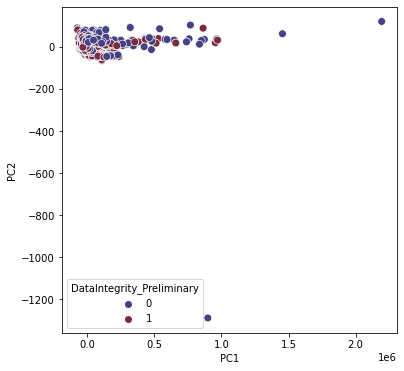

In [23]:
plt.figure(figsize = (6,6))
sb.scatterplot(data = principal_df, x='PC1', y='PC2', hue= 'DataIntegrity_Preliminary', s=60, palette='icefire')
plt.show()

## PCA with Standardized Data

In [37]:
import plotly.express as px
from sklearn.preprocessing import StandardScaler

In [26]:
#standardized df first. then call pca
df_std = StandardScaler().fit_transform(df)
df_std

array([[ 0.41242994,  0.94045379, -0.28238669, ..., -0.8483937 ,
        -0.12598344,  0.87593213],
       [ 0.40422248,  0.64342397, -0.41266869, ..., -0.8483937 ,
        -0.12598344,  0.87593213],
       [ 0.37139264,  0.77373963, -0.43635633, ...,  1.17869806,
        -0.12598344, -1.14164096],
       ...,
       [ 0.85563274, -0.2058746 ,  1.95609499, ...,  1.17869806,
        -0.12598344, -1.14164096],
       [-0.78585911, -0.76308636,  0.91383897, ...,  1.17869806,
        -0.12598344, -1.14164096],
       [-0.15388475, -1.12257782,  1.86134444, ...,  1.17869806,
        -0.12598344, -1.14164096]])

In [27]:
df_std.shape

(13569, 149)

In [28]:
df_std[:,0:148]

array([[ 0.41242994,  0.94045379, -0.28238669, ...,  0.41846197,
        -0.8483937 , -0.12598344],
       [ 0.40422248,  0.64342397, -0.41266869, ...,  0.41846197,
        -0.8483937 , -0.12598344],
       [ 0.37139264,  0.77373963, -0.43635633, ..., -2.38970343,
         1.17869806, -0.12598344],
       ...,
       [ 0.85563274, -0.2058746 ,  1.95609499, ...,  0.41846197,
         1.17869806, -0.12598344],
       [-0.78585911, -0.76308636,  0.91383897, ...,  0.41846197,
         1.17869806, -0.12598344],
       [-0.15388475, -1.12257782,  1.86134444, ...,  0.41846197,
         1.17869806, -0.12598344]])

In [29]:
df_std[:,0:148].shape

(13569, 148)

In [30]:
pca_applied_std = PCA(df_std[:,0:148], 2)

sorted eigenvectors 
 [[-8.59552558e-02 -6.87811561e-02  8.30559069e-02 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.66363075e-01 -1.05788636e-01  4.31707378e-02 ...  8.81788602e-17
  -4.87133153e-16 -1.38472993e-16]
 [ 1.39021248e-01  2.40978028e-01  5.46654413e-02 ...  4.76805995e-16
   8.41841739e-17 -2.96143879e-16]
 ...
 [ 1.56479595e-01 -1.04495246e-01 -2.91856402e-01 ...  9.19431879e-02
  -3.18289519e-02 -4.41037966e-02]
 [-4.01584067e-02  9.96987712e-02 -7.82993341e-02 ... -3.98986399e-17
  -1.98625838e-16 -1.17906986e-16]
 [ 3.61215721e-02  2.54899066e-02  2.36954347e-02 ...  6.93889390e-17
  -1.56125113e-17 -5.68121938e-17]]

 shape of X_reduced: (13569, 2)


In [31]:
principal_df_std = pd.DataFrame(pca_applied_std, columns=['PC1', 'PC2'])
principal_df_std

,PC1,PC2
0,-2.033644,-1.643280
1,-0.640456,-1.832562
2,-9.059603,3.463313
3,1.694999,-1.918250
4,-1.042484,-1.173937
...,...,...
13564,3.645143,3.574368
13565,4.101689,5.732306
13566,4.584440,9.126374
13567,4.865653,6.761749


In [32]:
target_std = df_std[:,148]
target_std

array([ 0.87593213,  0.87593213, -1.14164096, ..., -1.14164096,
       -1.14164096, -1.14164096])

In [34]:
principal_df_std['target'] = target_std
principal_df_std

,PC1,PC2,target
0,-2.033644,-1.643280,0.875932
1,-0.640456,-1.832562,0.875932
2,-9.059603,3.463313,-1.141641
3,1.694999,-1.918250,0.875932
4,-1.042484,-1.173937,-1.141641
...,...,...,...
13564,3.645143,3.574368,-1.141641
13565,4.101689,5.732306,-1.141641
13566,4.584440,9.126374,-1.141641
13567,4.865653,6.761749,-1.141641


## PCA Visualization

In [ ]:
plt.figure(figsize = (6,6))
sb.scatterplot(data = principal_df_std, x='PC1', y='PC2', hue='target', s=60, palette='icefire')

In [35]:
principal_df_std

,PC1,PC2,target
0,-2.033644,-1.643280,0.875932
1,-0.640456,-1.832562,0.875932
2,-9.059603,3.463313,-1.141641
3,1.694999,-1.918250,0.875932
4,-1.042484,-1.173937,-1.141641
...,...,...,...
13564,3.645143,3.574368,-1.141641
13565,4.101689,5.732306,-1.141641
13566,4.584440,9.126374,-1.141641
13567,4.865653,6.761749,-1.141641


In [38]:
fig_std2 = px.scatter(principal_df_std, x="PC1", y="PC2", color = "target")
fig_std2.show()

In [39]:
#3 components to std data
pca_applied_std3 = PCA(df_std[:,0:148], 3)

sorted eigenvectors 
 [[-8.59552558e-02 -6.87811561e-02  8.30559069e-02 ...  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [-1.66363075e-01 -1.05788636e-01  4.31707378e-02 ...  8.81788602e-17
  -4.87133153e-16 -1.38472993e-16]
 [ 1.39021248e-01  2.40978028e-01  5.46654413e-02 ...  4.76805995e-16
   8.41841739e-17 -2.96143879e-16]
 ...
 [ 1.56479595e-01 -1.04495246e-01 -2.91856402e-01 ...  9.19431879e-02
  -3.18289519e-02 -4.41037966e-02]
 [-4.01584067e-02  9.96987712e-02 -7.82993341e-02 ... -3.98986399e-17
  -1.98625838e-16 -1.17906986e-16]
 [ 3.61215721e-02  2.54899066e-02  2.36954347e-02 ...  6.93889390e-17
  -1.56125113e-17 -5.68121938e-17]]

 shape of X_reduced: (13569, 3)


In [40]:
principal_df_std3 = pd.DataFrame(pca_applied_std3, columns=['PC1', 'PC2', 'PC3'])
principal_df_std3

,PC1,PC2,PC3
0,-2.033644,-1.643280,-2.102462
1,-0.640456,-1.832562,-0.450143
2,-9.059603,3.463313,0.103898
3,1.694999,-1.918250,0.084918
4,-1.042484,-1.173937,0.433807
...,...,...,...
13564,3.645143,3.574368,-1.031667
13565,4.101689,5.732306,-0.660378
13566,4.584440,9.126374,2.198007
13567,4.865653,6.761749,-1.263067


In [41]:
target_std3 = df_std[:,148]
target_std3

array([ 0.87593213,  0.87593213, -1.14164096, ..., -1.14164096,
       -1.14164096, -1.14164096])

In [42]:
principal_df_std3['target'] = target_std3
principal_df_std3

,PC1,PC2,PC3,target
0,-2.033644,-1.643280,-2.102462,0.875932
1,-0.640456,-1.832562,-0.450143,0.875932
2,-9.059603,3.463313,0.103898,-1.141641
3,1.694999,-1.918250,0.084918,0.875932
4,-1.042484,-1.173937,0.433807,-1.141641
...,...,...,...,...
13564,3.645143,3.574368,-1.031667,-1.141641
13565,4.101689,5.732306,-0.660378,-1.141641
13566,4.584440,9.126374,2.198007,-1.141641
13567,4.865653,6.761749,-1.263067,-1.141641


In [43]:
#graph pca with 3 components
fig = px.scatter_3d(principal_df_std3, x="PC1", y="PC2", z="PC3", color = "target")
fig.show()

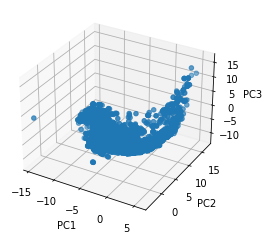

In [44]:
fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x=principal_df_std3['PC1']
y=principal_df_std3['PC2']
z=principal_df_std3['PC3']

# hue=principal_df_std3['target']

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

ax.scatter(x,y,z)

plt.show()

### Use PCA library to confirm results

In [46]:
df

,Width,Height,Depth,Volume,Band Count,RAM_TYPE_DDR SDRAM,RAM_TYPE_DDR2 SDRAM,RAM_TYPE_DDR3 SDRAM,RAM_TYPE_DDR3L SDRAM,RAM_TYPE_EDO DRAM,...,"ProtectionFromLiquids_5 Protected against low pressure jets (all directions), limited ingress",ProtectionFromLiquids_6 Protection against powerful jets of water,ProtectionFromLiquids_7 Protected against immersion up to 1m of depth,ProtectionFromLiquids_8 Protected against immersion beyond 1m of depth,ProtectionFromLiquids_9 Protected against high temperature high pressure spray downs,ProtectionFromLiquids_Non-standard protection,ProtectionFromLiquids_Yes,DataIntegrity_Final,DataIntegrity_Incomplete,DataIntegrity_Preliminary
0,76.6,162.91,8.95,111686.20870,14,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
1,76.5,156.30,8.40,100438.38000,21,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,76.1,159.20,8.30,100555.49600,20,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,73.7,145.10,9.45,101057.07150,12,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
4,71.3,148.95,8.39,89102.93265,21,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13564,61.3,115.90,12.90,91650.24300,4,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
13565,58.2,108.00,18.40,115655.04000,7,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
13566,82.0,137.40,18.40,207309.12000,3,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
13567,62.0,125.00,14.00,108500.00000,4,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


In [48]:
X_std = StandardScaler().fit_transform(df)
X_std

array([[ 0.41242994,  0.94045379, -0.28238669, ..., -0.8483937 ,
        -0.12598344,  0.87593213],
       [ 0.40422248,  0.64342397, -0.41266869, ..., -0.8483937 ,
        -0.12598344,  0.87593213],
       [ 0.37139264,  0.77373963, -0.43635633, ...,  1.17869806,
        -0.12598344, -1.14164096],
       ...,
       [ 0.85563274, -0.2058746 ,  1.95609499, ...,  1.17869806,
        -0.12598344, -1.14164096],
       [-0.78585911, -0.76308636,  0.91383897, ...,  1.17869806,
        -0.12598344, -1.14164096],
       [-0.15388475, -1.12257782,  1.86134444, ...,  1.17869806,
        -0.12598344, -1.14164096]])

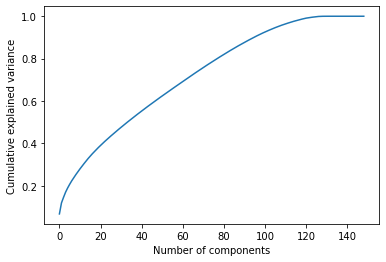

In [49]:
#choose number of components
pca = PCA().fit(X_std)
                
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

plt.show()

We can use the variance ratio to determine how many components are necessary to describe the data.

This curve quantifies how much of the total 149-dimensional variance is contained within the first N components. We see that we require around 40 components to describe 50% of the variance, and around 120 components to describe approximately 100% of the variance. 

Ultimately, we note that by projecting into a 2-dimensional space, we lose a lot of information and an estimated 100 components to retain 90% of the variance.

Source: https://jakevdp.github.io/PythonDataScienceHandbook/05.09-principal-component-analysis.html

In [50]:
pca_std = PCA(n_components=2)
Y_2sklearn_std = pca_std.fit_transform(X_std)

principal_df2_std = pd.DataFrame(data = Y_2sklearn_std, columns = ['PC1', 'PC2'])
principal_df2_std
# print("shape of y_sklearn:", Y_sklearn.shape)
# Y_sklearn

,PC1,PC2
0,1.987138,-1.732890
1,0.589258,-1.915987
2,9.134545,3.405920
3,-1.755424,-2.009922
4,1.075649,-1.008290
...,...,...
13564,-3.551830,3.769831
13565,-3.980738,5.920386
13566,-4.420400,9.298861
13567,-4.730522,6.959580


In [51]:
fig2_std = px.scatter(principal_df2_std, x="PC1", y="PC2", color = "PC1")
fig2_std.show()

In [52]:
#pca with 3 components - using library
sklearn_pca_std = PCA(n_components=3)
Y_sklearn_std = sklearn_pca_std.fit_transform(X_std)

principal_df_std = pd.DataFrame(data = Y_sklearn_std, columns = ['PC1', 'PC2', 'PC3'])
principal_df_std
# print("shape of y_sklearn:", Y_sklearn.shape)
# Y_sklearn

,PC1,PC2,PC3
0,1.987138,-1.732837,-2.237911
1,0.589265,-1.916047,-0.504360
2,9.134521,3.405782,0.286917
3,-1.755423,-2.009937,0.191095
4,1.075644,-1.008319,0.101191
...,...,...,...
13564,-3.551828,3.769954,-1.048373
13565,-3.980742,5.920456,-0.678386
13566,-4.420408,9.298801,1.715967
13567,-4.730540,6.959495,-1.283028


In [53]:
fig_std = px.scatter_3d(principal_df_std, x="PC1", y="PC2", z="PC3", color = "PC1")
fig_std.show()